In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
from matplotlib import rcParams
import matplotlib.font_manager
rcParams['font.sans-serif']=['Arial']
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
import matplotlib.pyplot as plt
import seaborn as sns

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.
scanpy==1.7.2 anndata==0.7.6 umap==0.4.6 numpy==1.22.4 scipy==1.6.2 pandas==1.5.2 scikit-learn==0.22 statsmodels==0.12.2 python-igraph==0.9.4


In [5]:
adata=sc.read('401875cells_RNA_norm.h5ad')

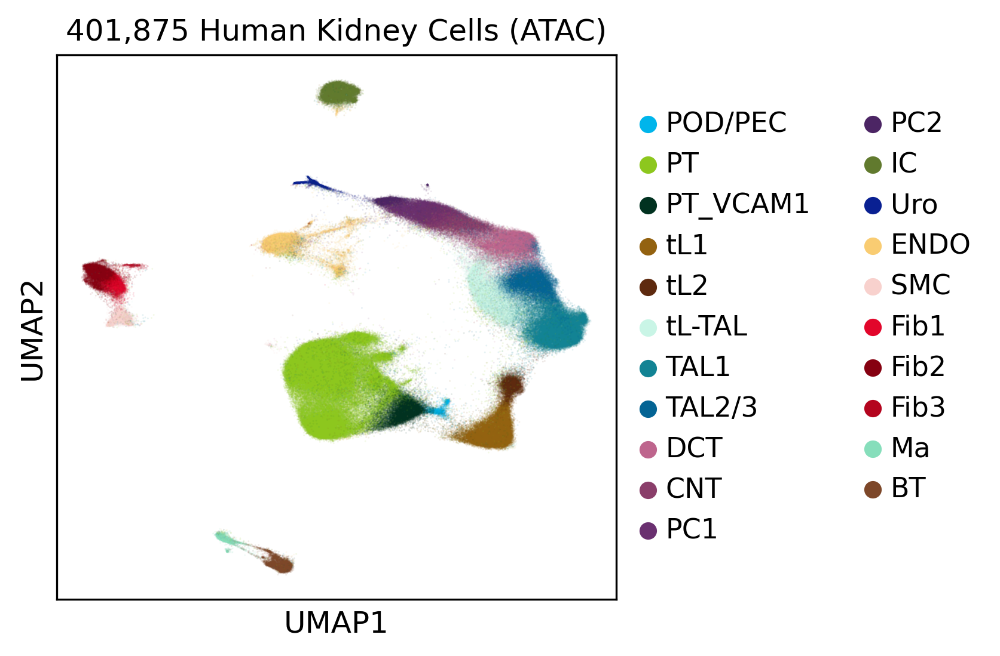

In [44]:
adata.uns['celltype_2023_colors']=[
 '#00B5EB',
 '#8DC71E', '#013220',#PT
'#936210', '#5E2A0F', '#C9F5E6', 
    '#128394','#046494',#TAL
 '#be658d','#8a3e6a', '#6a3070', '#4c2564',#distal
 '#617A2E',#ic
 '#092092',#Uro
 '#F9CC72', '#F8D1CD', #endo+smc
 '#E2062B', '#860111', '#B4041E',#Fib
 '#86DEBB', '#7D4729'
]
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
sc.pl.umap(adata, color=['celltype_2023'],alpha=0.1, size=2,title='401,875 Human Kidney Cells (ATAC)')

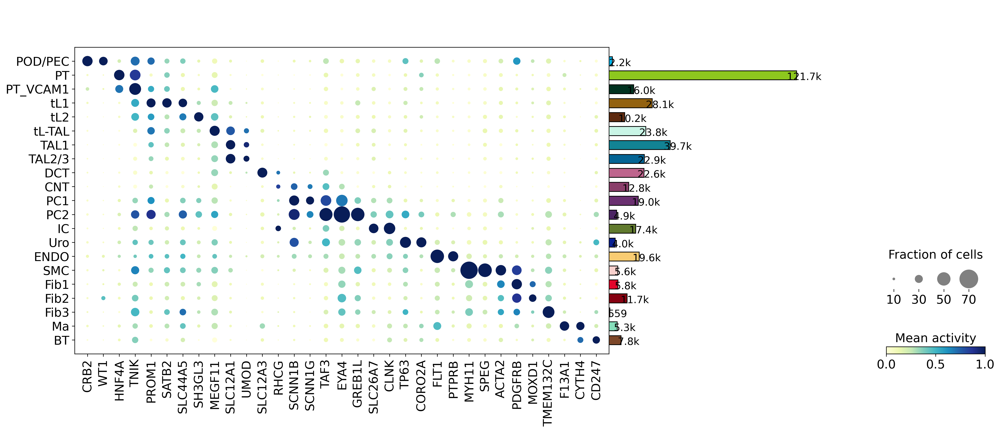

In [49]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=19)
marker_genes=['CRB2','WT1',
              'HNF4A','TNIK',
              'PROM1','SATB2','SLC44A5','SH3GL3','MEGF11',
              'SLC12A1','UMOD',
              'SLC12A3',
              'RHCG','SCNN1B','SCNN1G','TAF3','EYA4','GREB1L',
              'SLC26A7','CLNK',
              
              'TP63','CORO2A',
              'FLT1','PTPRB',
              'MYH11','SPEG','ACTA2','PDGFRB',
              'MOXD1','TMEM132C',
              'F13A1','CYTH4','CD247',
    ]
colors_dp=adata.uns['celltype_2023_colors']

sc.pl.DotPlot(adata, marker_genes, groupby='celltype_2023',
             standard_scale='var',expression_cutoff=0.9, use_raw=False)\
.add_totals(color=colors_dp,size=6)\
.style(cmap="YlGnBu",largest_dot=600,dot_edge_lw=0,size_exponent=2)\
.legend(width=3,colorbar_title='Mean activity',size_title='Fraction of cells\n').show()

In [55]:
adata.obs['celltype_2023'].value_counts()

PT          121675
TAL1         39742
tL1          28062
tL-TAL       23850
TAL2/3       22900
DCT          22644
ENDO         19556
PC1          19049
IC           17383
PT_VCAM1     15998
CNT          12831
Fib2         11733
tL2          10205
BT            7781
Fib1          5828
SMC           5623
Ma            5325
PC2           4936
Uro           4011
POD/PEC       2184
Fib3           559
Name: celltype_2023, dtype: int64

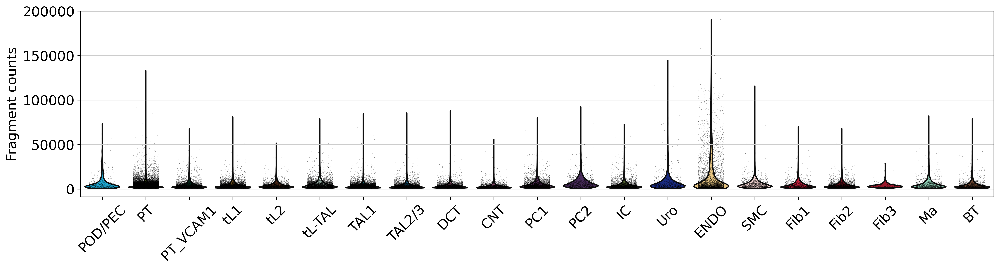

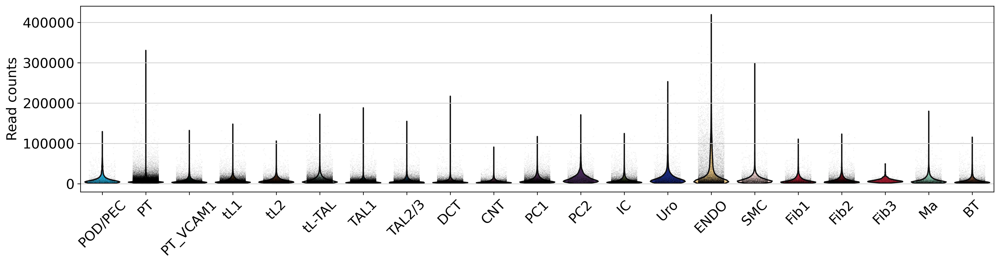

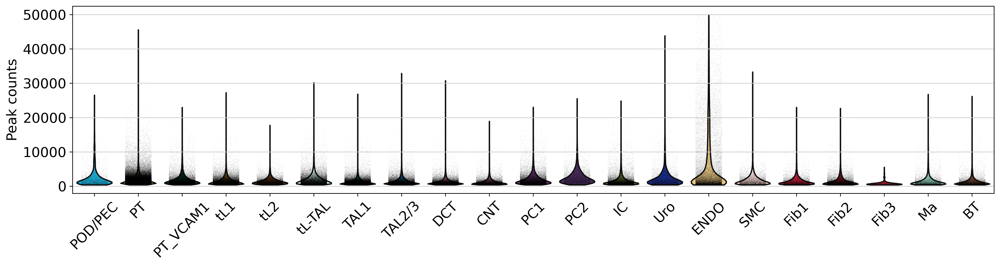

In [57]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)
rcParams['figure.figsize'] = 15,4
sc.pl.violin(adata,  'fragments',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='Fragment counts',scale='width',palette=adata.uns['celltype_2023_colors'])
sc.pl.violin(adata,  'reads_count',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='Read counts',scale='width',palette=adata.uns['celltype_2023_colors'])
sc.pl.violin(adata,  'nCount_peaks',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='Peak counts',scale='width',palette=adata.uns['celltype_2023_colors'])

In [59]:
print(np.mean(adata.obs['fragments']))
print(np.mean(adata.obs['reads_count']))
print(np.mean(adata.obs['nFeature_peaks']))
print(np.mean(adata.obs['nCount_peaks']))

4729.152296111975
8569.851140279938
1746.4991153965786
1865.9289181959564


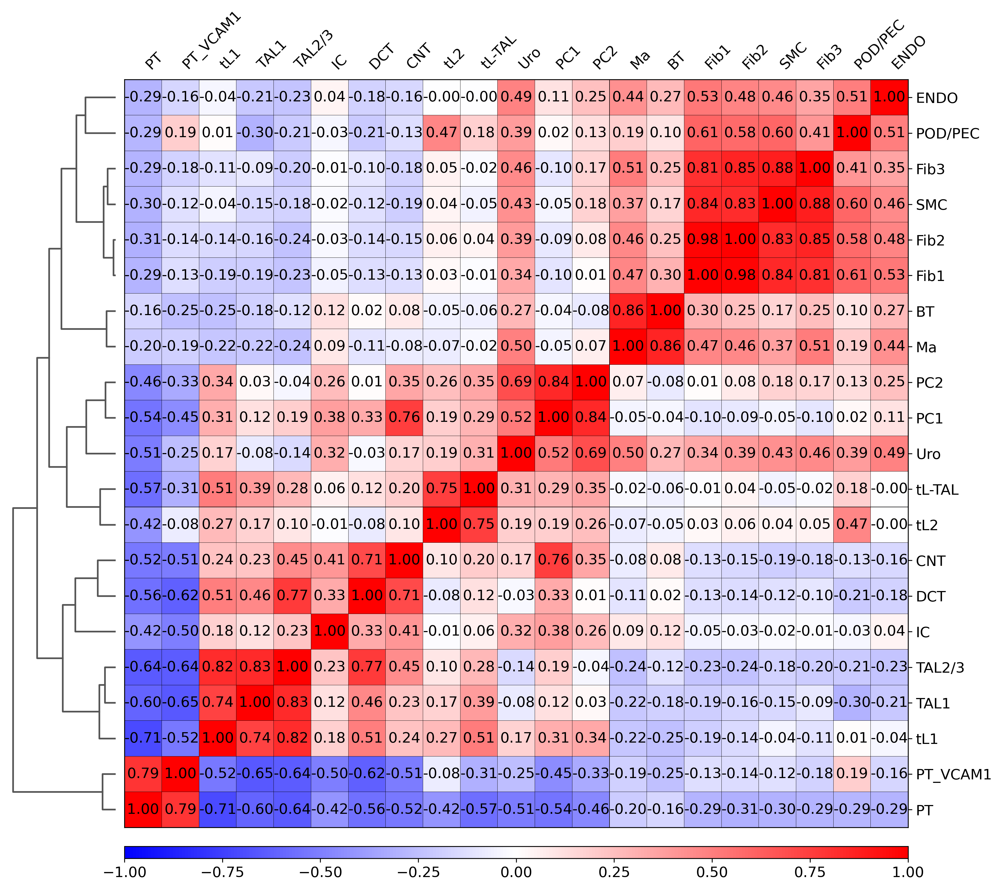

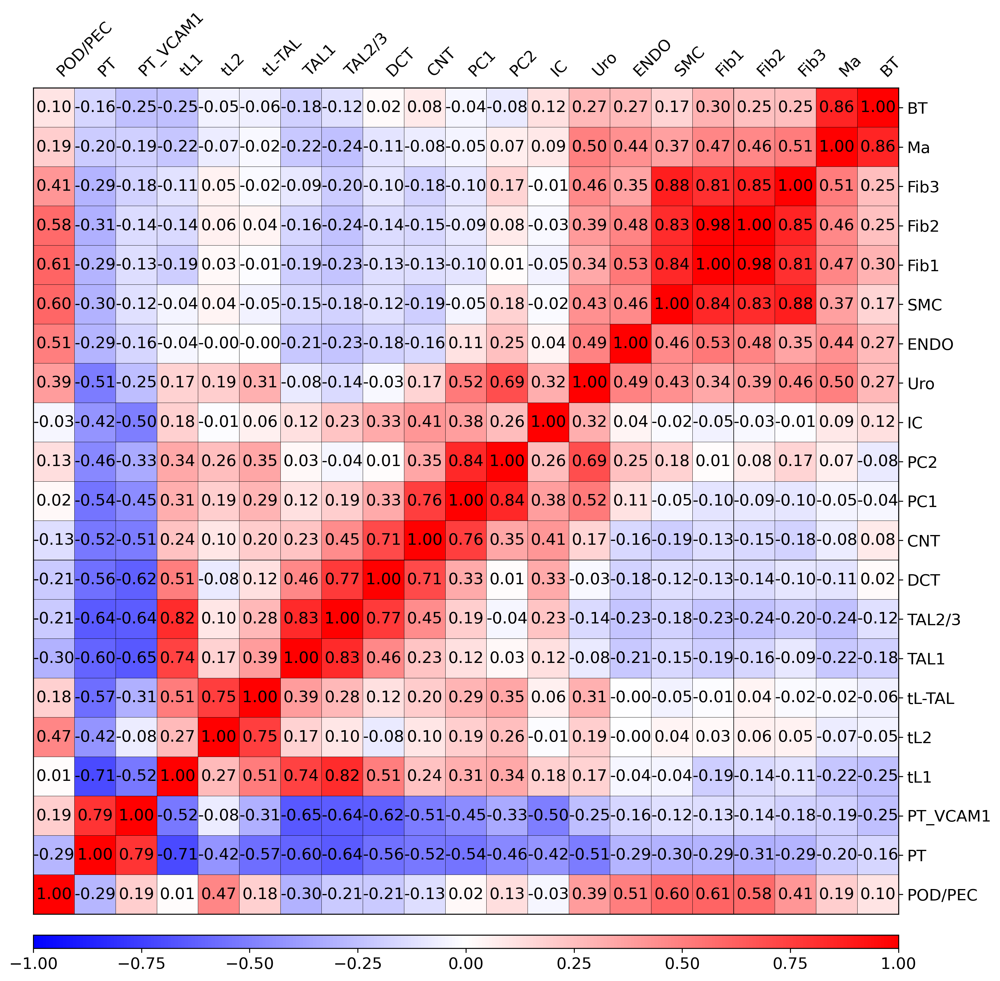

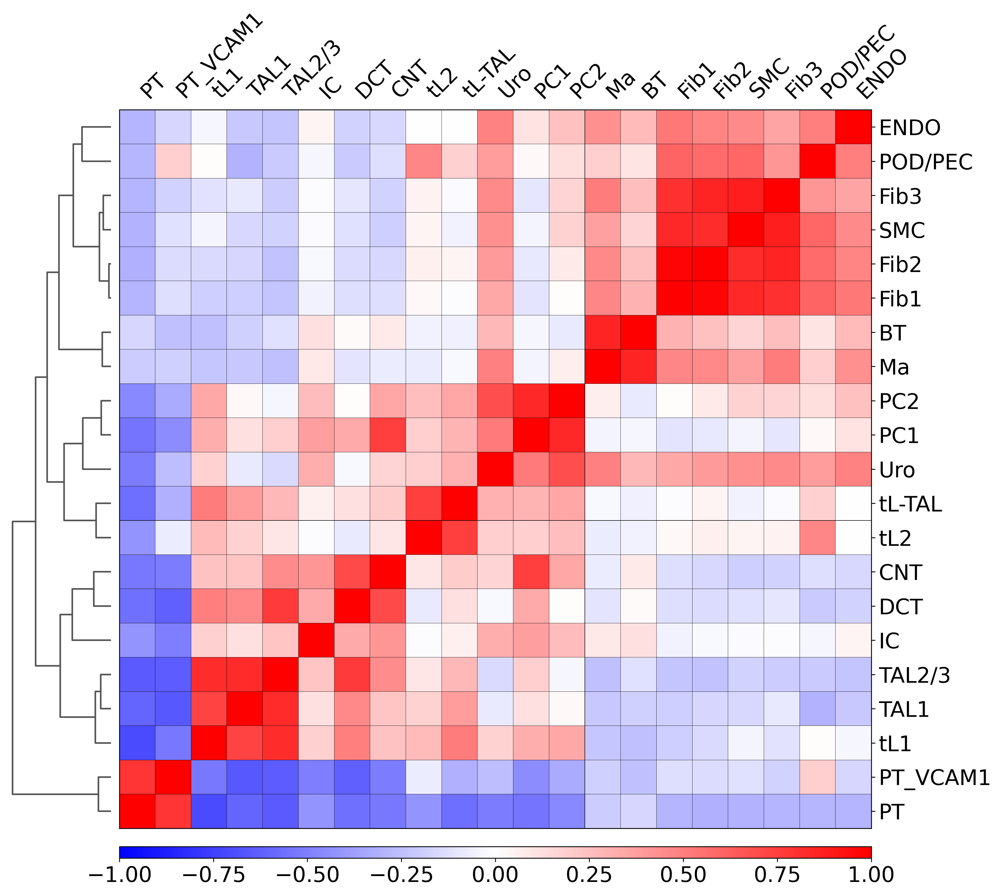

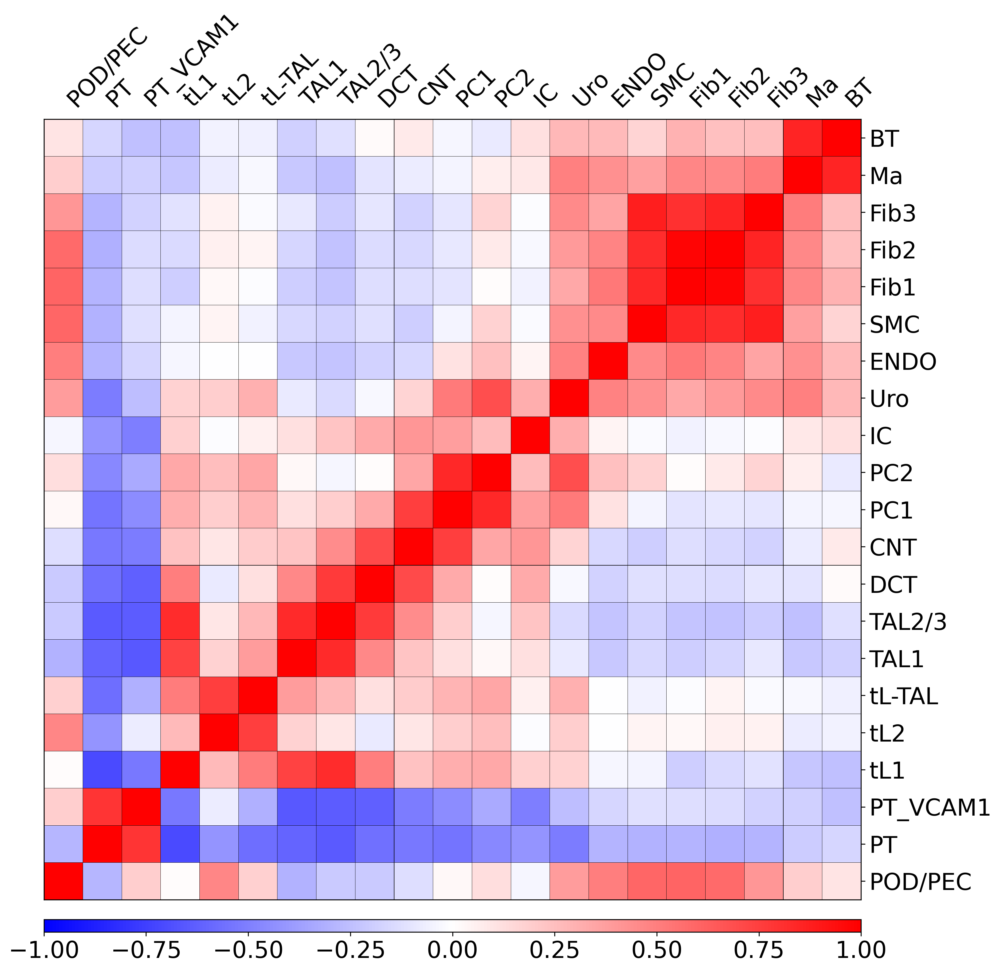

In [63]:
#correlation at the gene activity level
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=13)
sc.pl.correlation_matrix(adata, groupby='celltype_2023',show_correlation_numbers=True,dendrogram=True)
sc.pl.correlation_matrix(adata, groupby='celltype_2023',show_correlation_numbers=True,dendrogram=False)
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=20)
sc.pl.correlation_matrix(adata, groupby='celltype_2023',dendrogram=True)
sc.pl.correlation_matrix(adata, groupby='celltype_2023',dendrogram=False)

In [80]:
cell_order=['POD/PEC',
'PT','PT_VCAM1',
'tL1','tL2','tL-TAL','TAL1','TAL2/3',
'DCT','CNT','PC1','PC2',
'IC',
'Uro',
'ENDO','SMC',
'Fib1','Fib2','Fib3',
'Ma','BT']

sample_name=['AFBY380_C', 'AGAK419_C', 'AGFY330_C1', 'AGFY330_C2', 'AHBL363_C', 'AHBQ224_C', 'AHLD054_C',
 'AICO097_C', 'AID4428_C', 'AIEB037_C1', 'AIEB037_C2', 'AIEL007_C', 'AIEU059_C',
  'BMC21673_C','BMC34582_C', 'BMC48768_C', 'BMC54678_C','BxT0DCD14_C', 'BxT0DCD9_C', 'BxT0LD2_C', 'BxT0LD3_C', 'BxT0LD5_C', 'BxT1LD2_C',

 'AFBY380_M1','AFBY380_M2', 'AGAK419_M',  'AHBQ224_M', 'AID4428_M', 'AIEL007_M', 'AIEU059_M', 'AICO097_M','AHBL363_M','BxT0LD4_M',

 'AGFY330_P', 'AHBL363_P', 'AIEB037_P', 'AGAK419_P', 'AIEL007_P', 'AICO097_P','AID4428_P',

 'AFBY380_RA', 'AFCD398_RA', 'AGFY330_RA',
'AGAK419_U','AFCD398_U','AGFY330_U', 'AFBY380_U']

dict2=pd.value_counts(adata.obs['sample_id_new'])

output=open('atac_celltype_2023_ratio_in_47samples.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'BT':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['sample_id_new']==str(i)]
    celldict=pd.value_counts(sampletype['celltype_2023'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'BT':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('atac_celltype_2023_ratio_in_47samples.csv', delimiter = ',',index_col=False)

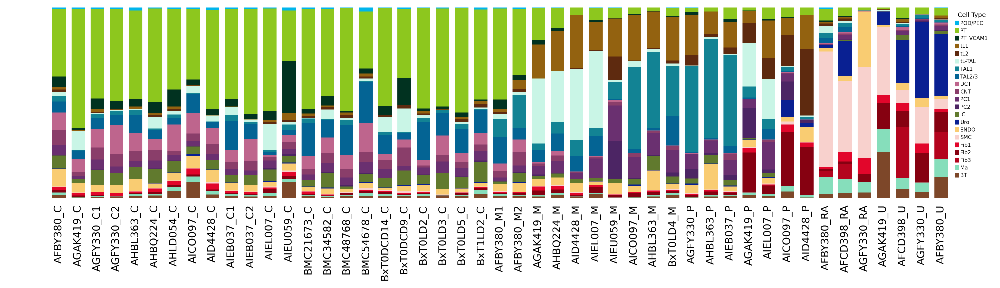

In [81]:
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,47)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['celltype_2023_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(14,4))
width =0.7
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=10)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1, 1),fontsize=5,frameon=False,title='Cell Type',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [84]:
sample_name=sorted(list(set(adata.obs['renal_region_new2'])))

dict2=pd.value_counts(adata.obs['renal_region_new2'])

output=open('atac_celltype_2023_ratio_in_5regions.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'BT':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['renal_region_new2']==str(i)]
    celldict=pd.value_counts(sampletype['celltype_2023'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'BT':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('atac_celltype_2023_ratio_in_5regions.csv', delimiter = ',',index_col=False)
file

,sample,POD/PEC%,PT%,PT_VCAM1%,tL1%,tL2%,tL-TAL%,TAL1%,TAL2/3%,DCT%,...,PC2%,IC%,Uro%,ENDO%,SMC%,Fib1%,Fib2%,Fib3%,Ma%,BT%
0,C,0.008488,0.459307,0.061868,0.010009,0.006655,0.031568,0.017215,0.067246,0.090860,...,0.002415,0.056338,0.002533,0.044044,0.003988,0.015478,0.009288,0.000030,0.012741,0.021976
1,M,0.002006,0.137940,0.013968,0.176424,0.014802,0.146503,0.188904,0.066726,0.015974,...,0.018234,0.030924,0.002650,0.047796,0.003009,0.008277,0.014813,0.000116,0.006187,0.006947
2,P,0.000420,0.039569,0.006286,0.140041,0.112266,0.040752,0.276549,0.016136,0.002536,...,0.040970,0.022313,0.020010,0.061805,0.005617,0.013864,0.108329,0.000062,0.011266,0.010223
3,RA,0.001968,0.031242,0.003936,0.002706,0.004920,0.013038,0.011562,0.010578,0.003690,...,0.000246,0.000738,0.026814,0.182042,0.499877,0.061009,0.028044,0.018942,0.068143,0.025092
4,U,0.000580,0.023994,0.001507,0.004289,0.004173,0.004057,0.007766,0.002318,0.004289,...,0.002202,0.005564,0.206561,0.020633,0.234960,0.039643,0.129361,0.053321,0.093312,0.151269


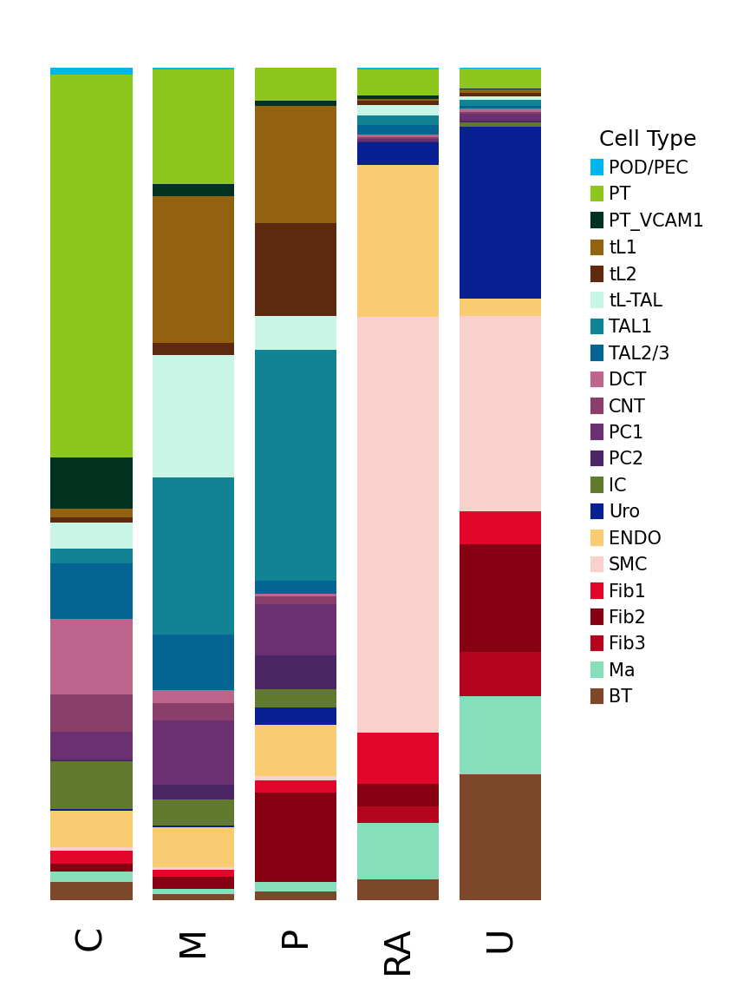

In [88]:
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,5)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['celltype_2023_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(3,4))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=10)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1.02, 0.9),fontsize=5,frameon=False,title='Cell Type',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [91]:
cell_order=['C','M','P','RA','U']

sample_name=['POD/PEC',
'PT','PT_VCAM1',
'tL1','tL2','tL-TAL','TAL1','TAL2/3',
'DCT','CNT','PC1','PC2',
'IC',
'Uro',
'ENDO','SMC',
'Fib1','Fib2','Fib3',
'Ma','BT']

dict2=pd.value_counts(adata.obs['celltype_2023'])

output=open('atac_renalregion_ratio_in_celltype_2023.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'U':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['celltype_2023']==str(i)]
    celldict=pd.value_counts(sampletype['renal_region_new2'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'U':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('atac_renalregion_ratio_in_celltype_2023.csv', delimiter = ',',index_col=False)
file

,sample,C%,M%,P%,RA%,U%
0,POD/PEC,0.894689,0.086996,0.012363,0.003663,0.002289
1,PT,0.868979,0.107376,0.020900,0.001044,0.001701
2,PT_VCAM1,0.890236,0.082698,0.025253,0.001000,0.000813
3,tL1,0.082104,0.595467,0.320718,0.000392,0.001319
4,tL2,0.150122,0.137384,0.707006,0.001960,0.003528
5,tL-TAL,0.304696,0.581803,0.109811,0.002222,0.001468
6,TAL1,0.099718,0.450204,0.447210,0.001183,0.001686
7,TAL2/3,0.675983,0.275983,0.045284,0.001878,0.000873
8,DCT,0.923688,0.066817,0.007198,0.000662,0.001634
9,CNT,0.795885,0.155171,0.046762,0.000546,0.001637


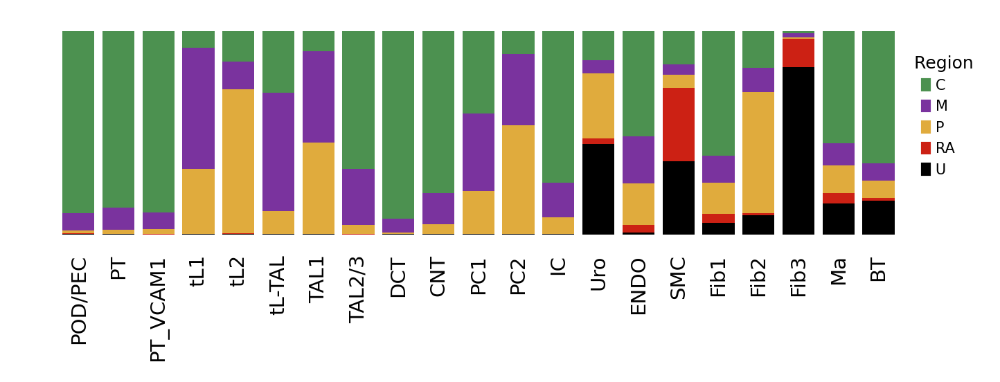

In [93]:
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,21)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['renal_region_new2_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(5,2))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=7)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(0.95, 0.9),fontsize=5,frameon=False,title='  Region',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [99]:
#correlation at the peak level
adata2=sc.read('401875cells_peaks.h5ad')

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:36:23)
Storing dendrogram info using `.uns['dendrogram_celltype_2023']`


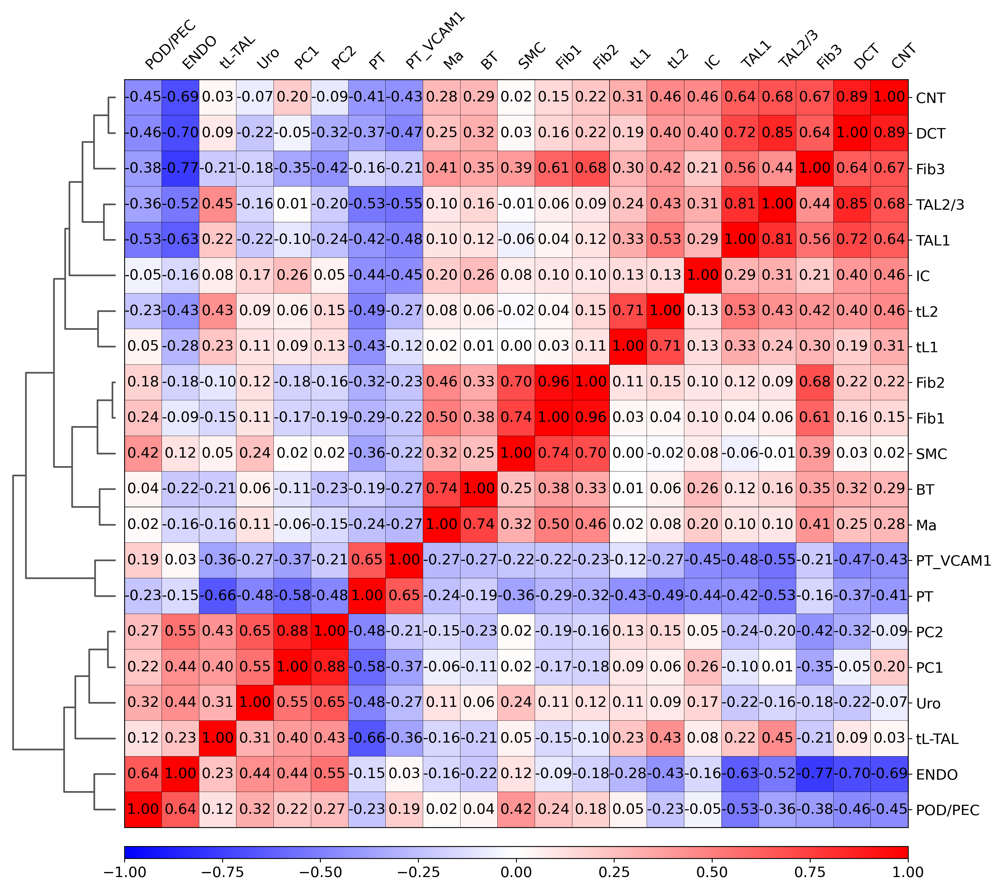

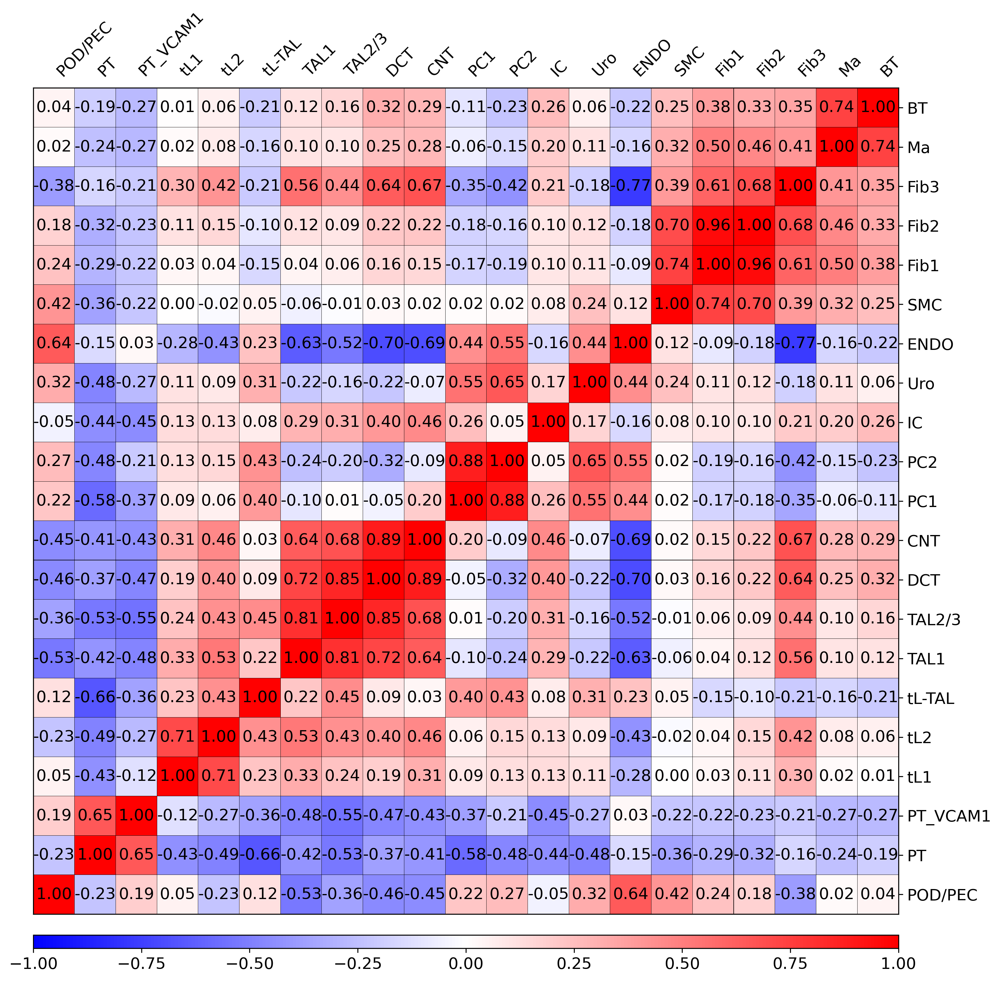

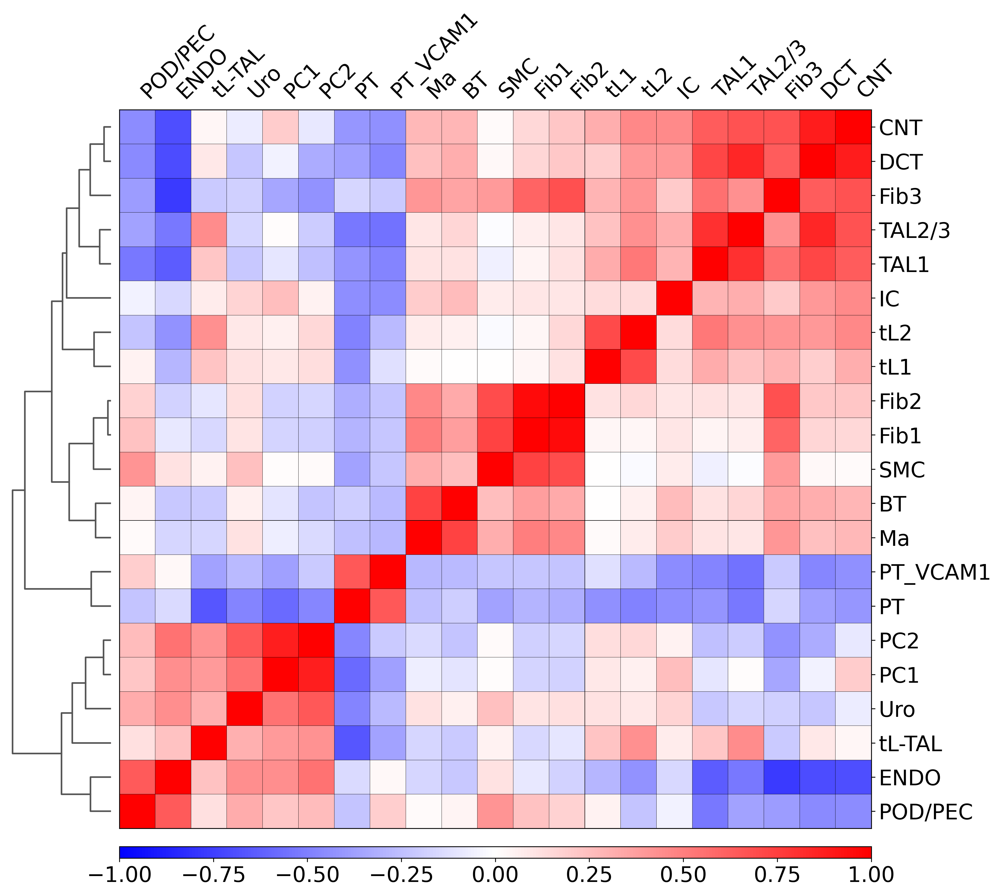

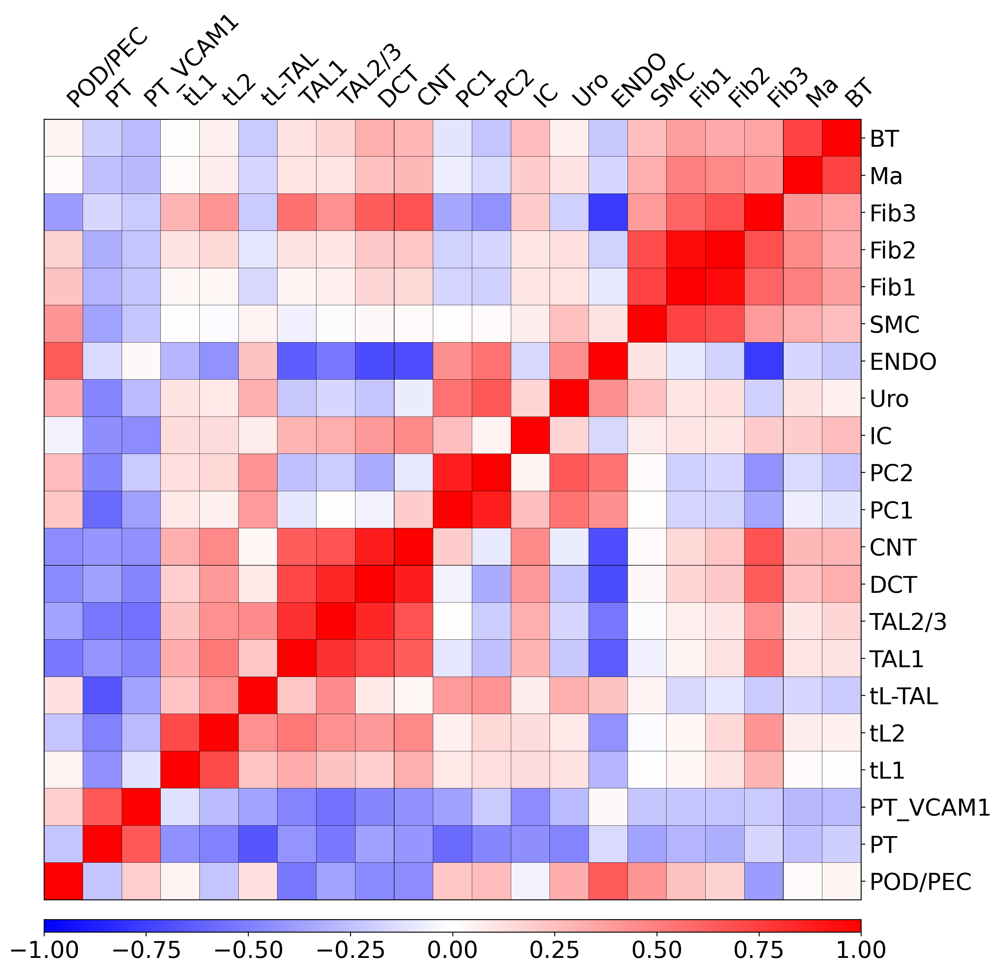

In [102]:
#correlation at the peak level
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=13)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',show_correlation_numbers=True,dendrogram=True)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',show_correlation_numbers=True,dendrogram=False)
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=20)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',dendrogram=True)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',dendrogram=False)